# Cognitive Architecture Comparison — AUTOPS Framework

Trade-space analysis across the morphological matrix dimensions.  
Compares architectures on the **7 research metrics**: Utility, Downlink Efficiency, Latency, Robustness, Resource Efficiency, Operator Load, Explainability.

**Pipeline**: `results.json` → `results_loader` (DataFrames) → `analysis` (statistics) → `plotting` (figures)

In [1]:
import sys
from pathlib import Path

ROOT = Path.cwd().parent if Path.cwd().name == "notebooks" else Path.cwd()
if str(ROOT) not in sys.path:
    sys.path.insert(0, str(ROOT))

import matplotlib.pyplot as plt
import pandas as pd

from src.orchestration.results_loader import load_multiple_experiments, load_results
from src.orchestration.analysis import (
    confidence_interval,
    episode_summary_with_ci,
    mann_whitney_test,
    kruskal_wallis_test,
    compute_pareto_frontier,
)
from src.orchestration import plotting

plotting.apply_style()
%matplotlib inline

# Robustness: robustness_cv (derived in Section 1 from episode utility values)
RESEARCH_METRICS = [
    "utility",
    "data_downlink_efficiency",
    "mean_latency_s",
    "resource_efficiency",
    "operator_load",
    "explainability_score",
    "robustness_cv",
]

# OODA-specific metrics (Phase 3)
OODA_METRICS = [
    "mean_orient_latency_s",
    "mean_orient_iterations",
    "mean_orient_urgency",
]

# ReAct-specific metrics (Phase 3)
REACT_METRICS = [
    "reasoning_depth",
    "iterations",
    "grounding_violations",
    "converged",
]

# Short labels: Representation / Loop / Ops -- 36 SAS + 12 Hierarchical MAS
# Hierarchical MAS follows Kim et al. (2025) [FVFQ73RF] Centralized MAS topology:
#   A = {mission_manager, sat_agent_0}, C = star, Omega = hierarchical
ARCH_LABELS = {
    # --- Symbolic (rule-based, deterministic) ---
    "eventsat_cen_sda_symb_hd_ah":   "Symbolic / SDA / AH",
    "eventsat_cen_sda_symb_hd_ag":   "Symbolic / SDA / AG",
    "eventsat_cen_sda_symb_hd_cg":   "Symbolic / SDA / CG",
    "eventsat_cen_ooda_symb_hd_ah":  "Symbolic / OODA / AH",
    "eventsat_cen_ooda_symb_hd_ag":  "Symbolic / OODA / AG",
    "eventsat_cen_ooda_symb_hd_cg":  "Symbolic / OODA / CG",
    "eventsat_cen_react_symb_hd_ah": "Symbolic / ReAct / AH",
    "eventsat_cen_react_symb_hd_ag": "Symbolic / ReAct / AG",
    "eventsat_cen_react_symb_hd_cg": "Symbolic / ReAct / CG",
    # --- LLM Hybrid ---
    "eventsat_cen_sda_hyre_hd_ah":   "LLM-Hybrid / SDA / AH",
    "eventsat_cen_sda_hyre_hd_ag":   "LLM-Hybrid / SDA / AG",
    "eventsat_cen_sda_hyre_hd_cg":   "LLM-Hybrid / SDA / CG",
    "eventsat_cen_ooda_hyre_hd_ah":  "LLM-Hybrid / OODA / AH",
    "eventsat_cen_ooda_hyre_hd_ag":  "LLM-Hybrid / OODA / AG",
    "eventsat_cen_ooda_hyre_hd_cg":  "LLM-Hybrid / OODA / CG",
    "eventsat_cen_react_hyre_hd_ah": "LLM-Hybrid / ReAct / AH",
    "eventsat_cen_react_hyre_hd_ag": "LLM-Hybrid / ReAct / AG",
    "eventsat_cen_react_hyre_hd_cg": "LLM-Hybrid / ReAct / CG",
    # --- Subsymbolic (RL) ---
    "eventsat_cen_sda_subm_le_ah":   "Subsymbolic / SDA / AH",
    "eventsat_cen_sda_subm_le_ag":   "Subsymbolic / SDA / AG",
    "eventsat_cen_sda_subm_le_cg":   "Subsymbolic / SDA / CG",
    "eventsat_cen_ooda_subm_le_ah":  "Subsymbolic / OODA / AH",
    "eventsat_cen_ooda_subm_le_ag":  "Subsymbolic / OODA / AG",
    "eventsat_cen_ooda_subm_le_cg":  "Subsymbolic / OODA / CG",
    "eventsat_cen_react_subm_le_ah": "Subsymbolic / ReAct / AH",
    "eventsat_cen_react_subm_le_ag": "Subsymbolic / ReAct / AG",
    "eventsat_cen_react_subm_le_cg": "Subsymbolic / ReAct / CG",
    # --- Agentic Hybrid ---
    "eventsat_cen_sda_hyag_hd_ah":   "Agentic / SDA / AH",
    "eventsat_cen_sda_hyag_hd_ag":   "Agentic / SDA / AG",
    "eventsat_cen_sda_hyag_hd_cg":   "Agentic / SDA / CG",
    "eventsat_cen_ooda_hyag_hd_ah":  "Agentic / OODA / AH",
    "eventsat_cen_ooda_hyag_hd_ag":  "Agentic / OODA / AG",
    "eventsat_cen_ooda_hyag_hd_cg":  "Agentic / OODA / CG",
    "eventsat_cen_react_hyag_hd_ah": "Agentic / ReAct / AH",
    "eventsat_cen_react_hyag_hd_ag": "Agentic / ReAct / AG",
    "eventsat_cen_react_hyag_hd_cg": "Agentic / ReAct / CG",
    # --- Hierarchical MAS -- Kim et al. (2025) Centralized MAS, ops=AH only ---
    "eventsat_hier_sda_symb_hd_ah":   "Hier-Symbolic / SDA / AH",
    "eventsat_hier_sda_hyre_hd_ah":   "Hier-LLM / SDA / AH",
    "eventsat_hier_sda_subm_le_ah":   "Hier-Subsymbolic / SDA / AH",
    "eventsat_hier_sda_hyag_hd_ah":   "Hier-Agentic / SDA / AH",
    "eventsat_hier_ooda_symb_hd_ah":  "Hier-Symbolic / OODA / AH",
    "eventsat_hier_ooda_hyre_hd_ah":  "Hier-LLM / OODA / AH",
    "eventsat_hier_ooda_subm_le_ah":  "Hier-Subsymbolic / OODA / AH",
    "eventsat_hier_ooda_hyag_hd_ah":  "Hier-Agentic / OODA / AH",
    "eventsat_hier_react_symb_hd_ah": "Hier-Symbolic / ReAct / AH",
    "eventsat_hier_react_hyre_hd_ah": "Hier-LLM / ReAct / AH",
    "eventsat_hier_react_subm_le_ah": "Hier-Subsymbolic / ReAct / AH",
    "eventsat_hier_react_hyag_hd_ah": "Hier-Agentic / ReAct / AH",
}

print(f"Project root: {ROOT}")
print(f"Architectures registered: {len(ARCH_LABELS)}  (36 SAS + 12 Hierarchical MAS)")

Project root: c:\Users\Clemente\autops-demo
Architectures registered: 48  (36 SAS + 12 Hierarchical MAS)


## 1. Load Data

In [2]:
EXPERIMENT_PATHS = [
    # --- Symbolic ---
    ROOT / "data" / "results" / "eventsat_cen_sda_symb_hd_ah"   / "results.json",
    ROOT / "data" / "results" / "eventsat_cen_sda_symb_hd_ag"   / "results.json",
    ROOT / "data" / "results" / "eventsat_cen_sda_symb_hd_cg"   / "results.json",
    ROOT / "data" / "results" / "eventsat_cen_ooda_symb_hd_ah"  / "results.json",
    ROOT / "data" / "results" / "eventsat_cen_ooda_symb_hd_ag"  / "results.json",
    ROOT / "data" / "results" / "eventsat_cen_ooda_symb_hd_cg"  / "results.json",
    ROOT / "data" / "results" / "eventsat_cen_react_symb_hd_ah" / "results.json",
    ROOT / "data" / "results" / "eventsat_cen_react_symb_hd_ag" / "results.json",
    ROOT / "data" / "results" / "eventsat_cen_react_symb_hd_cg" / "results.json",
    # --- LLM Hybrid ---
    ROOT / "data" / "results" / "eventsat_cen_sda_hyre_hd_ah"   / "results.json",
    ROOT / "data" / "results" / "eventsat_cen_sda_hyre_hd_ag"   / "results.json",
    ROOT / "data" / "results" / "eventsat_cen_sda_hyre_hd_cg"   / "results.json",
    ROOT / "data" / "results" / "eventsat_cen_ooda_hyre_hd_ah"  / "results.json",
    ROOT / "data" / "results" / "eventsat_cen_ooda_hyre_hd_ag"  / "results.json",
    ROOT / "data" / "results" / "eventsat_cen_ooda_hyre_hd_cg"  / "results.json",
    ROOT / "data" / "results" / "eventsat_cen_react_hyre_hd_ah" / "results.json",
    ROOT / "data" / "results" / "eventsat_cen_react_hyre_hd_ag" / "results.json",
    ROOT / "data" / "results" / "eventsat_cen_react_hyre_hd_cg" / "results.json",
    # --- Subsymbolic (RL) ---
    ROOT / "data" / "results" / "eventsat_cen_sda_subm_le_ah"   / "results.json",
    ROOT / "data" / "results" / "eventsat_cen_sda_subm_le_ag"   / "results.json",
    ROOT / "data" / "results" / "eventsat_cen_sda_subm_le_cg"   / "results.json",
    ROOT / "data" / "results" / "eventsat_cen_ooda_subm_le_ah"  / "results.json",
    ROOT / "data" / "results" / "eventsat_cen_ooda_subm_le_ag"  / "results.json",
    ROOT / "data" / "results" / "eventsat_cen_ooda_subm_le_cg"  / "results.json",
    ROOT / "data" / "results" / "eventsat_cen_react_subm_le_ah" / "results.json",
    ROOT / "data" / "results" / "eventsat_cen_react_subm_le_ag" / "results.json",
    ROOT / "data" / "results" / "eventsat_cen_react_subm_le_cg" / "results.json",
    # --- Agentic Hybrid ---
    ROOT / "data" / "results" / "eventsat_cen_sda_hyag_hd_ah"   / "results.json",
    ROOT / "data" / "results" / "eventsat_cen_sda_hyag_hd_ag"   / "results.json",
    ROOT / "data" / "results" / "eventsat_cen_sda_hyag_hd_cg"   / "results.json",
    ROOT / "data" / "results" / "eventsat_cen_ooda_hyag_hd_ah"  / "results.json",
    ROOT / "data" / "results" / "eventsat_cen_ooda_hyag_hd_ag"  / "results.json",
    ROOT / "data" / "results" / "eventsat_cen_ooda_hyag_hd_cg"  / "results.json",
    ROOT / "data" / "results" / "eventsat_cen_react_hyag_hd_ah" / "results.json",
    ROOT / "data" / "results" / "eventsat_cen_react_hyag_hd_ag" / "results.json",
    ROOT / "data" / "results" / "eventsat_cen_react_hyag_hd_cg" / "results.json",
    # --- Hierarchical MAS (Kim et al. 2025 Centralized MAS, ops=AH only) ---
    ROOT / "data" / "results" / "eventsat_hier_sda_symb_hd_ah"   / "results.json",
    ROOT / "data" / "results" / "eventsat_hier_sda_hyre_hd_ah"   / "results.json",
    ROOT / "data" / "results" / "eventsat_hier_sda_subm_le_ah"   / "results.json",
    ROOT / "data" / "results" / "eventsat_hier_sda_hyag_hd_ah"   / "results.json",
    ROOT / "data" / "results" / "eventsat_hier_ooda_symb_hd_ah"  / "results.json",
    ROOT / "data" / "results" / "eventsat_hier_ooda_hyre_hd_ah"  / "results.json",
    ROOT / "data" / "results" / "eventsat_hier_ooda_subm_le_ah"  / "results.json",
    ROOT / "data" / "results" / "eventsat_hier_ooda_hyag_hd_ah"  / "results.json",
    ROOT / "data" / "results" / "eventsat_hier_react_symb_hd_ah" / "results.json",
    ROOT / "data" / "results" / "eventsat_hier_react_hyre_hd_ah" / "results.json",
    ROOT / "data" / "results" / "eventsat_hier_react_subm_le_ah" / "results.json",
    ROOT / "data" / "results" / "eventsat_hier_react_hyag_hd_ah" / "results.json",
]

existing_paths = [p for p in EXPERIMENT_PATHS if p.exists()]
print(f"Found {len(existing_paths)} / {len(EXPERIMENT_PATHS)} experiment result files")

all_step_df, all_episode_df = load_multiple_experiments(existing_paths)

# Derive robustness_cv per experiment from episode utility values
# (CV = std/mean of utility across episodes — lower = more consistent)
cv_per_exp = (
    all_episode_df.groupby("experiment_id")["utility"]
    .agg(lambda x: (x.std() / x.mean() if x.mean() != 0 else 0.0) if len(x) >= 2 else 0.0)
    .rename("robustness_cv")
)
all_episode_df = all_episode_df.join(cv_per_exp, on="experiment_id")

print(f"Episodes:     {all_episode_df.shape[0]}")
print(f"Experiments:  {all_episode_df['experiment_id'].unique().tolist()}")

arch_cols = ["experiment_id", "agent_organization", "decision_procedure", "representation",
             "behaviour", "operations_paradigm"]
available_arch = [c for c in arch_cols if c in all_episode_df.columns]
all_episode_df[available_arch].drop_duplicates()

Found 48 / 48 experiment result files
Episodes:     48
Experiments:  ['eventsat_cen_sda_symb_hd_ah', 'eventsat_cen_sda_symb_hd_ag', 'eventsat_cen_sda_symb_hd_cg', 'eventsat_cen_ooda_symb_hd_ah', 'eventsat_cen_ooda_symb_hd_ag', 'eventsat_cen_ooda_symb_hd_cg', 'eventsat_cen_react_symb_hd_ah', 'eventsat_cen_react_symb_hd_ag', 'eventsat_cen_react_symb_hd_cg', 'eventsat_cen_sda_hyre_hd_ah', 'eventsat_cen_sda_hyre_hd_ag', 'eventsat_cen_sda_hyre_hd_cg', 'eventsat_cen_ooda_hyre_hd_ah', 'eventsat_cen_ooda_hyre_hd_ag', 'eventsat_cen_ooda_hyre_hd_cg', 'eventsat_cen_react_hyre_hd_ah', 'eventsat_cen_react_hyre_hd_ag', 'eventsat_cen_react_hyre_hd_cg', 'eventsat_cen_sda_subm_le_ah', 'eventsat_cen_sda_subm_le_ag', 'eventsat_cen_sda_subm_le_cg', 'eventsat_cen_ooda_subm_le_ah', 'eventsat_cen_ooda_subm_le_ag', 'eventsat_cen_ooda_subm_le_cg', 'eventsat_cen_react_subm_le_ah', 'eventsat_cen_react_subm_le_ag', 'eventsat_cen_react_subm_le_cg', 'eventsat_cen_sda_hyag_hd_ah', 'eventsat_cen_sda_hyag_hd_ag', 'eve

,experiment_id,agent_organization,decision_procedure,representation,behaviour,operations_paradigm
0,eventsat_cen_sda_symb_hd_ah,centralized,sda,symbolic,hand_designed,autonomous_hybrid
1,eventsat_cen_sda_symb_hd_ag,centralized,sda,symbolic,hand_designed,autonomous_ground
2,eventsat_cen_sda_symb_hd_cg,centralized,sda,symbolic,hand_designed,conventional_ground
3,eventsat_cen_ooda_symb_hd_ah,centralized,ooda,symbolic,hand_designed,autonomous_hybrid
4,eventsat_cen_ooda_symb_hd_ag,centralized,ooda,symbolic,hand_designed,autonomous_ground
5,eventsat_cen_ooda_symb_hd_cg,centralized,ooda,symbolic,hand_designed,conventional_ground
6,eventsat_cen_react_symb_hd_ah,centralized,react,symbolic,hand_designed,autonomous_hybrid
7,eventsat_cen_react_symb_hd_ag,centralized,react,symbolic,hand_designed,autonomous_ground
8,eventsat_cen_react_symb_hd_cg,centralized,react,symbolic,hand_designed,conventional_ground
9,eventsat_cen_sda_hyre_hd_ah,centralized,sda,hybrid,hand_designed,autonomous_hybrid


## 2. Research Metrics Summary Table

Mean +/- 95% CI per architecture with Kruskal-Wallis p-values. Exported as LaTeX for direct paper inclusion.

### Reading the p-value column

The **p-value** is the probability of seeing a difference this large by chance alone, assuming both architectures are actually equivalent.
It is *not* the probability that one architecture is better.

| sig | threshold | meaning |
|-----|-----------|---------|
| `***` | p < 0.001 | very strong evidence of a real difference |
| `**`  | p < 0.01  | strong evidence |
| `*`   | p < 0.05  | moderate evidence |
| `n.s.` | p >= 0.05 | insufficient evidence (not necessarily "no difference") |
| `-`   | constant  | metric does not vary across episodes; no test needed |

**Caveat - small sample:** with only 5 episodes per architecture the tests have low power. A `n.s.` result does not mean the architectures are equal; it means the dataset is too small to be sure.

In [3]:
available_research = [m for m in RESEARCH_METRICS if m in all_episode_df.columns]
FIGS_DIR = ROOT / "data" / "figures"
FIGS_DIR.mkdir(parents=True, exist_ok=True)

if available_research:
    table = plotting.format_comparison_table(
        all_episode_df,
        available_research,
        latex_path=FIGS_DIR / "metrics_table.tex",
    )
    display(table)
    print(f"LaTeX table saved → {FIGS_DIR / 'metrics_table.tex'}")
else:
    print("Research metrics not found — re-run experiment with updated pipeline.")

,eventsat_cen_sda_symb_hd_ah,eventsat_cen_sda_symb_hd_ag,eventsat_cen_sda_symb_hd_cg,eventsat_cen_ooda_symb_hd_ah,eventsat_cen_ooda_symb_hd_ag,eventsat_cen_ooda_symb_hd_cg,eventsat_cen_react_symb_hd_ah,eventsat_cen_react_symb_hd_ag,eventsat_cen_react_symb_hd_cg,eventsat_cen_sda_hyre_hd_ah,...,eventsat_hier_ooda_symb_hd_ah,eventsat_hier_ooda_hyre_hd_ah,eventsat_hier_ooda_subm_le_ah,eventsat_hier_ooda_hyag_hd_ah,eventsat_hier_react_symb_hd_ah,eventsat_hier_react_hyre_hd_ah,eventsat_hier_react_subm_le_ah,eventsat_hier_react_hyag_hd_ah,p-value,sig
Metric,,,,,,,,,,,,,,,,,,,,,
Utility,32.4,0,0,40.5,0,0,32.4,0,0,32.4,...,37.8,32.4,8.1,5.4,32.4,24.3,0,8.1,-,-
Downlink Efficiency,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,-,=
Mean Latency (ms),0.005194,0,0,0.06016,0,0,0.007303,0,0,4.133e+04,...,0.06605,6161,0.1228,260.1,0.01718,1.613,0.03135,1.153,-,-
Resource Efficiency,2.456,0,0,2.763,0,0,2.456,0,0,2.669,...,2.857,2.846,0.8627,0.9164,2.456,2.194,0,1.096,-,-
Operator Load,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,-,=
Explainability,1,0,0,1,0,0,1,0,0,1,...,1,1,1,1,1,1,1,1,-,-
Robustness (CV),0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,-,=


LaTeX table saved → c:\Users\Clemente\autops-demo\data\figures\metrics_table.tex


## 3. Multi-Metric Architecture Comparison

Normalised horizontal bar chart — all metrics on the same axis (higher bar = better performance).  
`LOWER_IS_BETTER` metrics (latency, operator load, robustness, explainability) are inverted before normalisation.

In [4]:
COMPARISON_METRICS = [
    "utility",
    "data_downlink_efficiency",
    "resource_efficiency",
    "operator_load",
    "explainability_score",
    "mean_latency_s",
    "robustness_cv",
]
avail_comparison = [m for m in COMPARISON_METRICS if m in all_episode_df.columns]

if avail_comparison:
    fig = plotting.plot_metric_comparison_bars(
        all_episode_df,
        avail_comparison,
        group_labels=ARCH_LABELS,
        save_path=FIGS_DIR / "metric_comparison_bars.pdf",
    )
    plt.show()

## 4. Pareto Frontiers — Trade-Space Analysis

Three independent trade-off views. A Pareto-optimal architecture is not dominated by any other on both axes simultaneously.

c:\Users\Clemente\autops-demo\src\orchestration\plotting.py:900: UserWarning: 
The palette list has fewer values (10) than needed (48) and will cycle, which may produce an uninterpretable plot.
  sns.scatterplot(


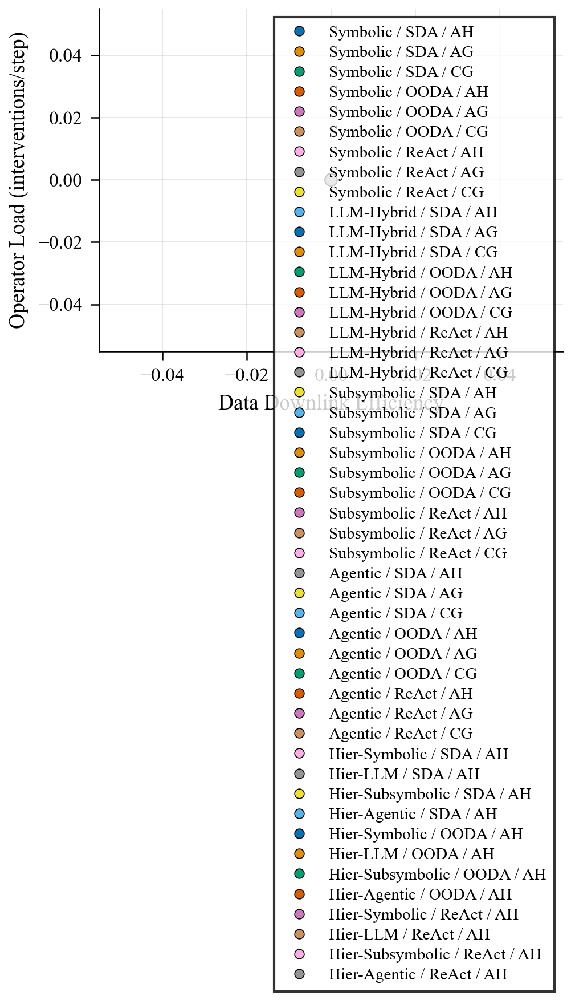

In [5]:
# --- Plot 1: Data Downlink Efficiency vs Operator Load ---
# Answers RQ2: how much data throughput do you get per unit of human intervention?
if "data_downlink_efficiency" in all_episode_df.columns and "operator_load" in all_episode_df.columns:
    plot_df = all_episode_df.copy()
    plot_df["Architecture"] = plot_df["experiment_id"].map(ARCH_LABELS).fillna(plot_df["experiment_id"])
    plotting.plot_pareto(
        plot_df,
        x_metric="data_downlink_efficiency",
        y_metric="operator_load",
        group_col="Architecture",
        xlabel="Data Downlink Efficiency",
        ylabel="Operator Load (interventions/step)",
        save_path=FIGS_DIR / "pareto_dl_opload.pdf",
    )
    plt.show()

c:\Users\Clemente\autops-demo\src\orchestration\plotting.py:900: UserWarning: 
The palette list has fewer values (10) than needed (48) and will cycle, which may produce an uninterpretable plot.
  sns.scatterplot(


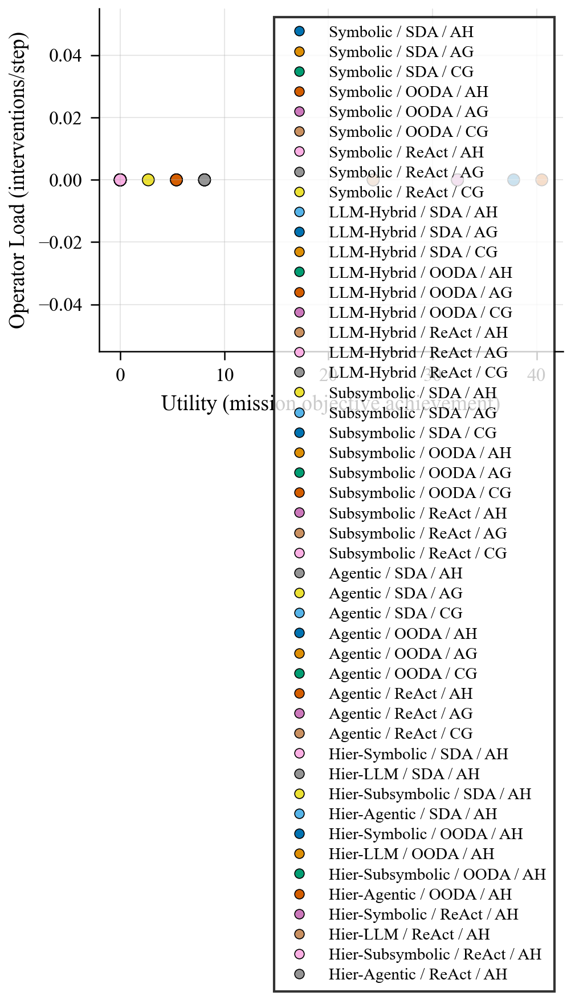

In [6]:
# --- Plot 2: Utility vs Operator Load ---
if "utility" in all_episode_df.columns and "operator_load" in all_episode_df.columns:
    plot_df = all_episode_df.copy()
    plot_df["Architecture"] = plot_df["experiment_id"].map(ARCH_LABELS).fillna(plot_df["experiment_id"])
    plotting.plot_pareto(
        plot_df,
        x_metric="utility",
        y_metric="operator_load",
        group_col="Architecture",
        xlabel="Utility (mission objective achievement)",
        ylabel="Operator Load (interventions/step)",
        save_path=FIGS_DIR / "pareto_util_opload.pdf",
    )
    plt.show()

c:\Users\Clemente\autops-demo\src\orchestration\plotting.py:900: UserWarning: 
The palette list has fewer values (10) than needed (48) and will cycle, which may produce an uninterpretable plot.
  sns.scatterplot(


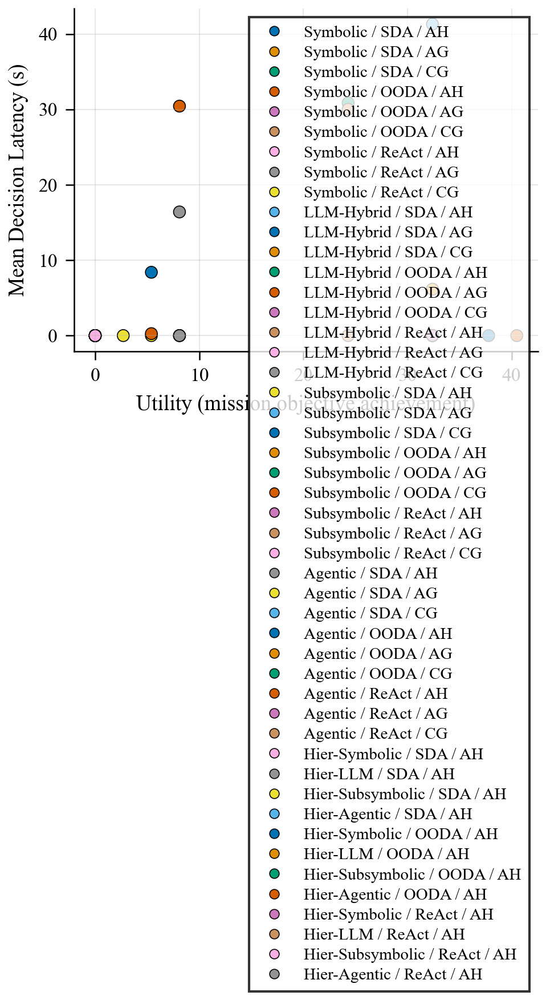

In [7]:
# --- Plot 3: Utility vs Decision Latency ---
if "utility" in all_episode_df.columns and "mean_latency_s" in all_episode_df.columns:
    plot_df = all_episode_df.copy()
    plot_df["Architecture"] = plot_df["experiment_id"].map(ARCH_LABELS).fillna(plot_df["experiment_id"])
    plotting.plot_pareto(
        plot_df,
        x_metric="utility",
        y_metric="mean_latency_s",
        group_col="Architecture",
        xlabel="Utility (mission objective achievement)",
        ylabel="Mean Decision Latency (s)",
        save_path=FIGS_DIR / "pareto_util_latency.pdf",
    )
    plt.show()

## 5. Operations Timeline

Hero figure: side-by-side operational behaviour for each architecture over a representative episode.  
Rows show (top to bottom): operational mode, battery SoC, cumulative downlinked data.

c:\Users\Clemente\autops-demo\src\orchestration\plotting.py:64: UserWarning: constrained_layout not applied because axes sizes collapsed to zero.  Try making figure larger or Axes decorations smaller.
  fig.savefig(p)
c:\Users\Clemente\autops-demo\.venv\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: constrained_layout not applied because axes sizes collapsed to zero.  Try making figure larger or Axes decorations smaller.
  fig.canvas.print_figure(bytes_io, **kw)


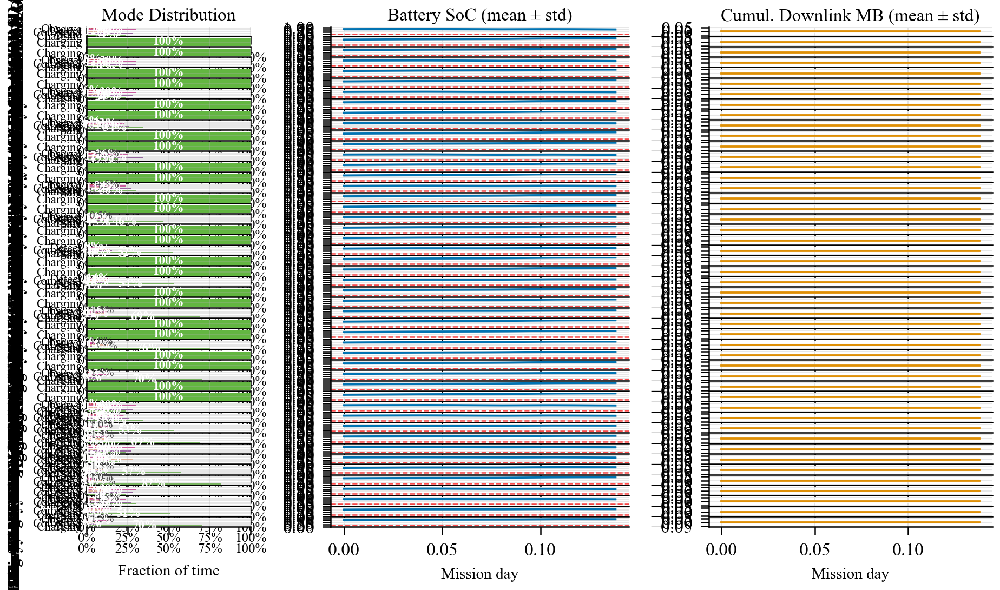

c:\Users\Clemente\autops-demo\src\orchestration\plotting.py:848: UserWarning: Tight layout not applied. tight_layout cannot make Axes height small enough to accommodate all Axes decorations.
  fig.tight_layout()


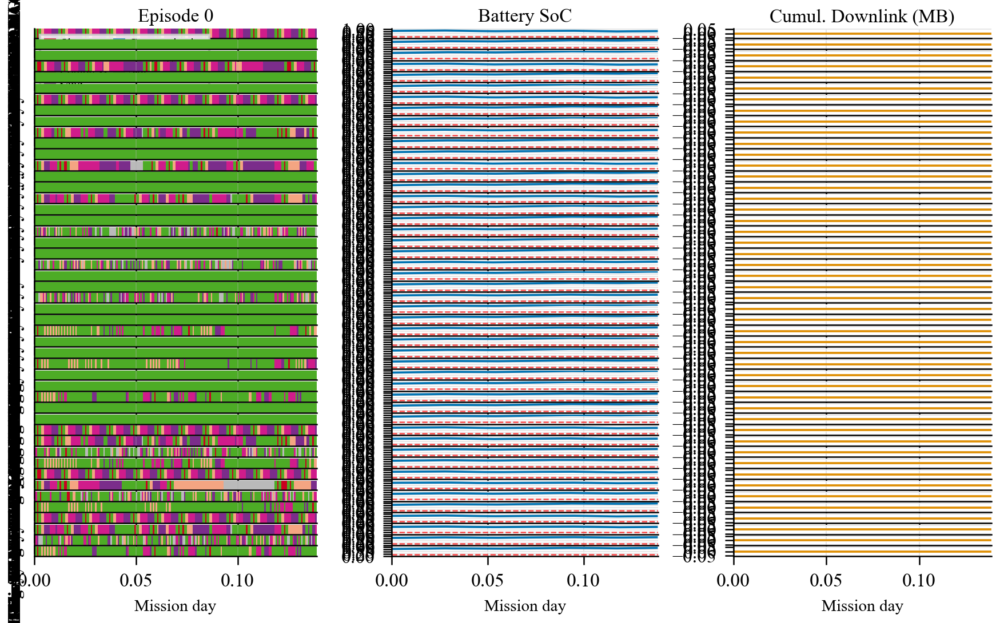

In [8]:
# Build per-architecture step DataFrames from the combined all_step_df
step_dfs_by_arch = {
    ARCH_LABELS.get(exp_id, exp_id): all_step_df[all_step_df["experiment_id"] == exp_id].copy()
    for exp_id in all_step_df["experiment_id"].unique()
    if exp_id in ARCH_LABELS
}

if step_dfs_by_arch and any(
    "resolved_mode" in sdf.columns or "battery_soc" in sdf.columns
    for sdf in step_dfs_by_arch.values()
):
    # Aggregate (mean +/- std across all episodes) — hero figure for paper
    fig = plotting.plot_operations_timeline(
        step_dfs_by_arch,
        figsize=(7.2, 4.0),
        save_path=FIGS_DIR / "operations_timeline.pdf",
    )
    plt.show()

    # Single-episode detail — episode 0 shared across architectures for direct comparison
    fig = plotting.plot_operations_timeline_episode(
        step_dfs_by_arch,
        episode_id=0,
        figsize=(7.2, 4.0),
        save_path=FIGS_DIR / "operations_timeline_ep0.pdf",
    )
    plt.show()
else:
    print("Step-level data (resolved_mode / battery_soc) not available — re-run experiment.")

## 6. Statistical Tests

Non-parametric tests comparing architectures on each research metric. See Section 2 for how to read p-values and significance stars.

**Kruskal-Wallis H-test** (omnibus): non-parametric analogue of one-way ANOVA. Tests whether episode scores across all architectures could plausibly come from the same distribution. H near 0 = complete overlap; higher H = more separation.

**Mann-Whitney U-test** (pairwise): compares two groups directly. **Effect size** r = 1 - 2U / (n1 * n2), range [-1, +1]: |r| > 0.5 is a large effect; sign shows direction (positive = group A higher).

> **Note on identical H values:** with n=5 per architecture, H=6.818 is the *maximum possible* statistic — achieved whenever every episode of one architecture ranks above every episode of the other (complete separation). Multiple metrics sharing H=6.818 simply means all of them perfectly separate the two architectures; it is not a computation error.

In [9]:
import numpy as _np

n_groups = all_episode_df["experiment_id"].nunique()
available_research = [m for m in RESEARCH_METRICS if m in all_episode_df.columns]

if n_groups >= 2 and available_research:
    rows = []
    for m in available_research:
        # Skip metrics that are constant across all episodes in all groups
        all_vals = all_episode_df[m].dropna()
        if all_vals.std() < 1e-10:
            rows.append({
                "Metric": plotting.METRIC_LABELS.get(m, m),
                "H": "—", "p-value": "—", "sig": "—",
                "note": "constant — no test needed",
            })
            continue
        kw = kruskal_wallis_test(all_episode_df, m)
        if _np.isnan(kw["p_value"]):
            rows.append({
                "Metric": plotting.METRIC_LABELS.get(m, m),
                "H": "—", "p-value": "—", "sig": "—",
                "note": "insufficient variance",
            })
            continue
        sig = "***" if kw["p_value"] < 0.001 else "**" if kw["p_value"] < 0.01 else "*" if kw["p_value"] < 0.05 else "n.s."
        rows.append({
            "Metric": plotting.METRIC_LABELS.get(m, m),
            "H": f"{kw['H_statistic']:.3f}",
            "p-value": f"{kw['p_value']:.4f}",
            "sig": sig,
            "note": "",
        })
    print("Kruskal-Wallis omnibus tests:")
    display(pd.DataFrame(rows).set_index("Metric"))

    # Pairwise Mann-Whitney U with effect size r
    print("\nMann-Whitney U (pairwise) + effect size r:")
    mw_rows = []
    key_metrics = [m for m in ["utility", "data_downlink_efficiency", "operator_load", "robustness_cv"]
                   if m in all_episode_df.columns]
    for m in key_metrics:
        if all_episode_df[m].dropna().std() < 1e-10:
            continue
        mw_df = mann_whitney_test(all_episode_df, m)
        if mw_df.empty:
            continue
        for _, row in mw_df.iterrows():
            n1 = len(all_episode_df.loc[all_episode_df["experiment_id"] == row["group_a"], m].dropna())
            n2 = len(all_episode_df.loc[all_episode_df["experiment_id"] == row["group_b"], m].dropna())
            a_label = ARCH_LABELS.get(row["group_a"], row["group_a"])
            b_label = ARCH_LABELS.get(row["group_b"], row["group_b"])
            r = 1 - 2 * row["U_statistic"] / (n1 * n2) if n1 * n2 > 0 else float("nan")
            p = row["p_value"]
            sig = "***" if p < 0.001 else "**" if p < 0.01 else "*" if p < 0.05 else "n.s."
            direction = f"{a_label} > {b_label}" if r > 0 else f"{b_label} > {a_label}" if r < 0 else "tied"
            mw_rows.append({
                "Metric": plotting.METRIC_LABELS.get(m, m),
                "Comparison": f"{a_label} vs {b_label}",
                "U": f"{row['U_statistic']:.0f}",
                "p-value": f"{p:.4f}",
                "sig": sig,
                "effect r": f"{r:+.2f}",
                "direction": direction,
            })
    if mw_rows:
        display(pd.DataFrame(mw_rows).set_index("Metric"))
else:
    print(f"Only {n_groups} experiment(s) — need ≥ 2 for hypothesis tests.")

Kruskal-Wallis omnibus tests:


,H,p-value,sig,note
Metric,,,,
Utility,—,—,—,insufficient variance
Downlink Efficiency,—,—,—,constant — no test needed
Mean Latency (ms),—,—,—,insufficient variance
Resource Efficiency,—,—,—,insufficient variance
Operator Load,—,—,—,constant — no test needed
Explainability,—,—,—,insufficient variance
Robustness (CV),—,—,—,insufficient variance



Mann-Whitney U (pairwise) + effect size r:


## 7. Morphological Matrix Heatmap

Requires experiments spanning ≥ 2 values along each morphological dimension.

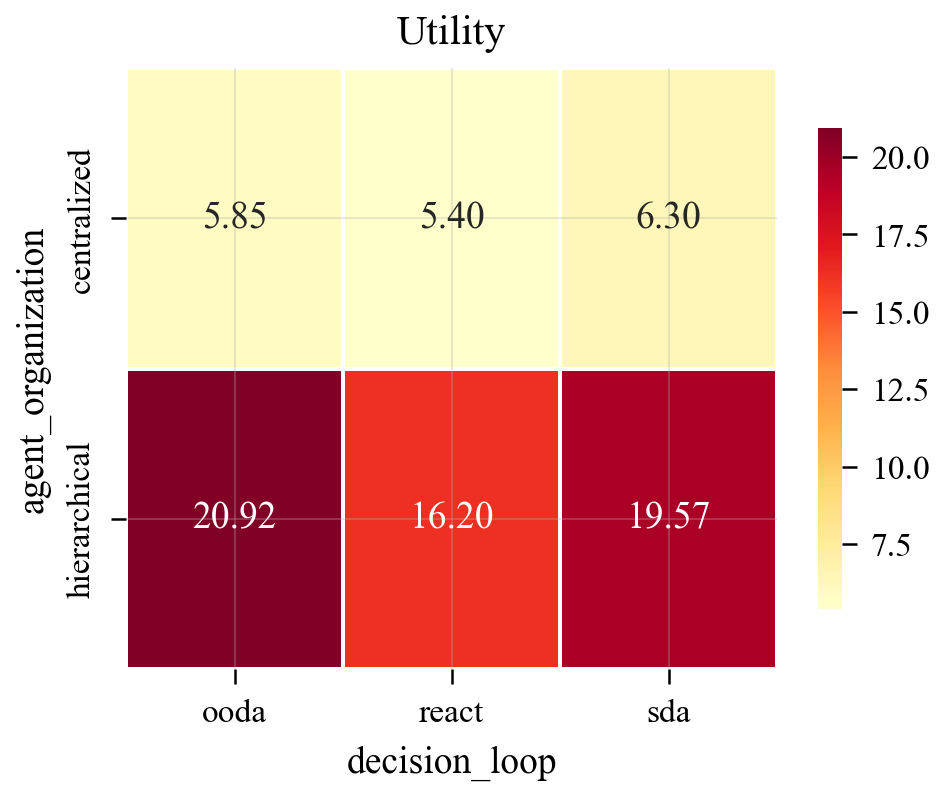

In [10]:
if (
    "decision_procedure" in all_episode_df.columns
    and all_episode_df["decision_procedure"].nunique() >= 2
    and "utility" in all_episode_df.columns
):
    plotting.plot_metric_heatmap(
        all_episode_df, "utility",
        save_path=FIGS_DIR / "heatmap_utility.pdf",
    )
    plt.show()
else:
    print("Need experiments with varying decision_procedure (SDA + OODA) for heatmap.")
    print("Run OODA experiments to enable this visualization.")

## 7b. OODA Decision Loop Analysis

Orient phase overhead and quality metrics. Compares SDA (no orient) vs OODA (with orient)
across both operations paradigms.

**Literature basis:**
- Miller et al. (2021): OODA loop duration as gamma-distributed TPM
- Hartmann et al. (2024) METIS: situation classification + CBR in Orient

In [11]:
# --- OODA-specific analysis ---
ooda_avail = [m for m in OODA_METRICS if m in all_episode_df.columns]
has_ooda = any("ooda" in eid for eid in all_episode_df["experiment_id"].unique())

if has_ooda and ooda_avail:
    print("=== OODA Orient Phase Metrics ===\n")

    # Summary table: OODA metrics per experiment
    ooda_summary = (
        all_episode_df[all_episode_df["decision_procedure"] == "ooda"]
        .groupby("experiment_id")[ooda_avail]
        .agg(["mean", "std"])
    )
    display(ooda_summary)

    # Compare latency breakdown: SDA total vs OODA (observe + orient + decide)
    print("\n=== Latency Comparison: SDA vs OODA ===\n")
    latency_cols = ["mean_latency_s"] + [m for m in ["mean_orient_latency_s"] if m in all_episode_df.columns]
    latency_summary = (
        all_episode_df
        .groupby(["decision_procedure", "operations_paradigm"])[latency_cols]
        .mean()
    )
    display(latency_summary)

    # Orient urgency distribution (how often is the situation urgent?)
    if "mean_orient_urgency" in all_episode_df.columns:
        print("\n=== Orient Urgency by Operations Paradigm ===")
        urgency_by_ops = (
            all_episode_df[all_episode_df["decision_procedure"] == "ooda"]
            .groupby("operations_paradigm")["mean_orient_urgency"]
            .agg(["mean", "std", "min", "max"])
        )
        display(urgency_by_ops)

    # SDA vs OODA on research metrics (same representation, different loop)
    if "decision_procedure" in all_episode_df.columns and all_episode_df["decision_procedure"].nunique() >= 2:
        print("\n=== SDA vs OODA: Research Metrics (Autonomous Hybrid only) ===\n")
        ah_only = all_episode_df[all_episode_df["operations_paradigm"] == "autonomous_hybrid"]
        if ah_only["decision_procedure"].nunique() >= 2:
            compare_metrics = [m for m in RESEARCH_METRICS if m in ah_only.columns]
            for m in compare_metrics:
                if ah_only[m].dropna().std() < 1e-10:
                    continue
                mw = mann_whitney_test(ah_only, m)
                if not mw.empty:
                    row = mw.iloc[0]
                    p = row["p_value"]
                    sig = "***" if p < 0.001 else "**" if p < 0.01 else "*" if p < 0.05 else "n.s."
                    print(f"  {m:30s}  U={row['U_statistic']:.0f}  p={p:.4f}  {sig}")
else:
    print("OODA results not yet available. Run the OODA experiments first:")
    print("  uv run autops run configs/experiments/eventsat_cen_ooda_symb_hd_ah.yaml")
    print("  uv run autops run configs/experiments/eventsat_cen_ooda_symb_hd_cg.yaml")

=== OODA Orient Phase Metrics ===



mean_orient_latency_s      \
                                               mean std   
experiment_id                                             
eventsat_cen_ooda_hyag_hd_ag               0.000000 NaN   
eventsat_cen_ooda_hyag_hd_ah               0.000053 NaN   
eventsat_cen_ooda_hyag_hd_cg               0.000000 NaN   
eventsat_cen_ooda_hyre_hd_ag               0.000000 NaN   
eventsat_cen_ooda_hyre_hd_ah               0.000078 NaN   
eventsat_cen_ooda_hyre_hd_cg               0.000000 NaN   
eventsat_cen_ooda_subm_le_ag               0.000000 NaN   
eventsat_cen_ooda_subm_le_ah               0.000057 NaN   
eventsat_cen_ooda_subm_le_cg               0.000000 NaN   
eventsat_cen_ooda_symb_hd_ag               0.000000 NaN   
eventsat_cen_ooda_symb_hd_ah               0.000036 NaN   
eventsat_cen_ooda_symb_hd_cg               0.000000 NaN   
eventsat_hier_ooda_hyag_hd_ah              0.000058 NaN   
eventsat_hier_ooda_hyre_hd_ah              0.000135 NaN   
eventsat_hier_ooda_subm_le_ah              0.000060 NaN   
eventsat_hier_ooda_symb_hd_ah              0.000040 NaN   

                              mean_orient_iterations     mean_orient_urgency  \
                                                mean std                mean   
experiment_id                                                                  
eventsat_cen_ooda_hyag_hd_ag                     0.0 NaN              0.0000   
eventsat_cen_ooda_hyag_hd_ah                     1.0 NaN              0.1960   
eventsat_cen_ooda_hyag_hd_cg                     0.0 NaN              0.0000   
eventsat_cen_ooda_hyre_hd_ag                     0.0 NaN              0.0000   
eventsat_cen_ooda_hyre_hd_ah                     1.0 NaN              0.1640   
eventsat_cen_ooda_hyre_hd_cg                     0.0 NaN              0.0000   
eventsat_cen_ooda_subm_le_ag                     0.0 NaN              0.0000   
eventsat_cen_ooda_subm_le_ah                     1.0 NaN              0.0245   
eventsat_cen_ooda_subm_le_cg                     0.0 NaN              0.0000   
eventsat_cen_ooda_symb_hd_ag                     0.0 NaN              0.0000   
eventsat_cen_ooda_symb_hd_ah                     1.0 NaN              0.1955   
eventsat_cen_ooda_symb_hd_cg                     0.0 NaN              0.0000   
eventsat_hier_ooda_hyag_hd_ah                    1.0 NaN              0.1820   
eventsat_hier_ooda_hyre_hd_ah                    1.0 NaN              0.1570   
eventsat_hier_ooda_subm_le_ah                    1.0 NaN              0.1950   
eventsat_hier_ooda_symb_hd_ah                    1.0 NaN              0.1970   

                                   
                              std  
experiment_id                      
eventsat_cen_ooda_hyag_hd_ag  NaN  
eventsat_cen_ooda_hyag_hd_ah  NaN  
eventsat_cen_ooda_hyag_hd_cg  NaN  
eventsat_cen_ooda_hyre_hd_ag  NaN  
eventsat_cen_ooda_hyre_hd_ah  NaN  
eventsat_cen_ooda_hyre_hd_cg  NaN  
eventsat_cen_ooda_subm_le_ag  NaN  
eventsat_cen_ooda_subm_le_ah  NaN  
eventsat_cen_ooda_subm_le_cg  NaN  
eventsat_cen_ooda_symb_hd_ag  NaN  
eventsat_cen_ooda_symb_hd_ah  NaN  
eventsat_cen_ooda_symb_hd_cg  NaN  
eventsat_hier_ooda_hyag_hd_ah NaN  
eventsat_hier_ooda_hyre_hd_ah NaN  
eventsat_hier_ooda_subm_le_ah NaN  
eventsat_hier_ooda_symb_hd_ah NaN


=== Latency Comparison: SDA vs OODA ===



mean_latency_s  mean_orient_latency_s
decision_procedure operations_paradigm                                       
ooda          autonomous_ground          0.000000               0.000000
              autonomous_hybrid          5.712445               0.000065
              conventional_ground        0.000000               0.000000
react         autonomous_ground          0.000000               0.000000
              autonomous_hybrid          7.559959               0.000000
              conventional_ground        0.000000               0.000000
sda           autonomous_ground          0.000000               0.000000
              autonomous_hybrid          7.217447               0.000000
              conventional_ground        0.000000               0.000000


=== Orient Urgency by Operations Paradigm ===


,mean,std,min,max
operations_paradigm,,,,
autonomous_ground,0.000000,0.000000,0.0000,0.000
autonomous_hybrid,0.163875,0.058431,0.0245,0.197
conventional_ground,0.000000,0.000000,0.0000,0.000



=== SDA vs OODA: Research Metrics (Autonomous Hybrid only) ===



## 7c. ReAct Decision Loop Analysis

Reasoning depth, grounding violations, and convergence rate. Compares SDA/OODA (no iterative reasoning)
vs ReAct (Thought-Action-Observation cycles).

**Literature basis:**
- Yao et al. (2023) ReAct: interleaved reasoning + acting
- Li (2025): ReAct applied to satellite ops

In [12]:
# --- ReAct-specific analysis ---
react_avail = [m for m in REACT_METRICS if m in all_episode_df.columns]
has_react = any("react" in eid for eid in all_episode_df["experiment_id"].unique())

if has_react and react_avail:
    print("=== ReAct Loop Metrics ===\n")

    react_df = all_episode_df[all_episode_df["decision_procedure"] == "react"]

    # Summary: mean reasoning depth, iterations, convergence rate per experiment
    react_summary = react_df.groupby("experiment_id")[react_avail].agg(["mean", "std"])
    display(react_summary)

    # Convergence rate by operations paradigm
    if "converged" in react_avail:
        print("\n=== Convergence Rate by Operations Paradigm ===")
        conv_by_ops = (
            react_df.groupby("operations_paradigm")["converged"]
            .agg(["mean", "std", "min", "max"])
        )
        display(conv_by_ops)

    # Grounding violations: compare across ops paradigms
    if "grounding_violations" in react_avail:
        print("\n=== Grounding Violations by Operations Paradigm ===")
        viol_by_ops = (
            react_df.groupby("operations_paradigm")["grounding_violations"]
            .agg(["mean", "std", "min", "max"])
        )
        display(viol_by_ops)

    # Compare all three loops on research metrics (Autonomous Hybrid only)
    if "decision_procedure" in all_episode_df.columns:
        ah_only = all_episode_df[all_episode_df["operations_paradigm"] == "autonomous_hybrid"]
        loops = ah_only["decision_procedure"].unique()
        if len(loops) >= 2:
            print(f"\n=== Loop Comparison on Key Metrics (Autonomous Hybrid, {len(loops)} loops) ===\n")
            for m in ["utility", "mean_latency_s", "data_downlink_efficiency"]:
                if m not in ah_only.columns:
                    continue
                if ah_only[m].dropna().std() < 1e-10:
                    print(f"  {m:30s}  constant — no variance")
                    continue
                kw = kruskal_wallis_test(ah_only, m)
                sig = "***" if kw["p_value"] < 0.001 else "**" if kw["p_value"] < 0.01 else "*" if kw["p_value"] < 0.05 else "n.s."
                print(f"  {m:30s}  H={kw['H_statistic']:.3f}  p={kw['p_value']:.4f}  {sig}")
else:
    print("ReAct results not yet available, or loop-specific metrics not in aggregated output.")
    print("Run the ReAct experiments first:")
    print("  uv run autops run configs/experiments/eventsat_cen_react_symb_hd_ah.yaml")

=== ReAct Loop Metrics ===



reasoning_depth     iterations      \
                                          mean std       mean std   
experiment_id                                                       
eventsat_cen_react_hyag_hd_ag             0.00 NaN        0.0 NaN   
eventsat_cen_react_hyag_hd_ah             1.00 NaN        1.0 NaN   
eventsat_cen_react_hyag_hd_cg             0.00 NaN        0.0 NaN   
eventsat_cen_react_hyre_hd_ag             0.00 NaN        0.0 NaN   
eventsat_cen_react_hyre_hd_ah             1.00 NaN        1.0 NaN   
eventsat_cen_react_hyre_hd_cg             0.00 NaN        0.0 NaN   
eventsat_cen_react_subm_le_ag             0.00 NaN        0.0 NaN   
eventsat_cen_react_subm_le_ah             3.00 NaN        2.0 NaN   
eventsat_cen_react_subm_le_cg             0.00 NaN        0.0 NaN   
eventsat_cen_react_symb_hd_ag             0.00 NaN        0.0 NaN   
eventsat_cen_react_symb_hd_ah             2.12 NaN        1.3 NaN   
eventsat_cen_react_symb_hd_cg             0.00 NaN        0.0 NaN   
eventsat_hier_react_hyag_hd_ah            1.00 NaN        1.0 NaN   
eventsat_hier_react_hyre_hd_ah            1.00 NaN        1.0 NaN   
eventsat_hier_react_subm_le_ah            3.00 NaN        2.0 NaN   
eventsat_hier_react_symb_hd_ah            2.12 NaN        1.3 NaN   

                               grounding_violations     converged      
                                               mean std      mean std  
experiment_id                                                          
eventsat_cen_react_hyag_hd_ag                   0.0 NaN       0.0 NaN  
eventsat_cen_react_hyag_hd_ah                   0.0 NaN       1.0 NaN  
eventsat_cen_react_hyag_hd_cg                   0.0 NaN       0.0 NaN  
eventsat_cen_react_hyre_hd_ag                   0.0 NaN       0.0 NaN  
eventsat_cen_react_hyre_hd_ah                   0.0 NaN       1.0 NaN  
eventsat_cen_react_hyre_hd_cg                   0.0 NaN       0.0 NaN  
eventsat_cen_react_subm_le_ag                   0.0 NaN       0.0 NaN  
eventsat_cen_react_subm_le_ah                   0.0 NaN       1.0 NaN  
eventsat_cen_react_subm_le_cg                   0.0 NaN       0.0 NaN  
eventsat_cen_react_symb_hd_ag                   0.0 NaN       0.0 NaN  
eventsat_cen_react_symb_hd_ah                   0.0 NaN       1.0 NaN  
eventsat_cen_react_symb_hd_cg                   0.0 NaN       0.0 NaN  
eventsat_hier_react_hyag_hd_ah                  0.0 NaN       1.0 NaN  
eventsat_hier_react_hyre_hd_ah                  0.0 NaN       1.0 NaN  
eventsat_hier_react_subm_le_ah                  0.0 NaN       1.0 NaN  
eventsat_hier_react_symb_hd_ah                  0.0 NaN       1.0 NaN


=== Convergence Rate by Operations Paradigm ===


,mean,std,min,max
operations_paradigm,,,,
autonomous_ground,0.0,0.0,0.0,0.0
autonomous_hybrid,1.0,0.0,1.0,1.0
conventional_ground,0.0,0.0,0.0,0.0



=== Grounding Violations by Operations Paradigm ===


,mean,std,min,max
operations_paradigm,,,,
autonomous_ground,0.0,0.0,0.0,0.0
autonomous_hybrid,0.0,0.0,0.0,0.0
conventional_ground,0.0,0.0,0.0,0.0



=== Loop Comparison on Key Metrics (Autonomous Hybrid, 3 loops) ===

  utility                         H=nan  p=nan  n.s.
  mean_latency_s                  H=nan  p=nan  n.s.
  data_downlink_efficiency        constant — no variance


## 8. Export Summary

All figures saved to `data/figures/` as PDF (vector) and SVG (journal submission). LaTeX table at `metrics_table.tex`.

## 9. Animated Ground Track

Satellite ground track for a single episode, animated over the first day of the mission.
Track is color-coded by operational mode. Ground station visibility footprint shown when a pass is active.

**Requirements:**
- `cartopy` for the world map: `uv sync --extra viz`
- `ffmpeg` for MP4: `conda install ffmpeg` or download from [ffmpeg.org](https://ffmpeg.org)
- `pillow` for GIF: already in `viz` extras

In [13]:
import os

# Animation is slow (~10 min with cartopy). Skip in headless/CI mode.
# Set SKIP_ANIMATION=1 to skip, or run interactively in VSCode.
if os.environ.get("SKIP_ANIMATION"):
    print("Skipping animation (SKIP_ANIMATION is set)")
else:
    from src.orchestration.animation import animate_ground_track
    from src.orchestration.results_loader import load_results

    ANIMATE_EXP = "eventsat_cen_sda_symb_hd_ah"
    results_raw = load_results(ROOT / "data" / "results" / ANIMATE_EXP / "results.json")
    anim_step_df = all_step_df[all_step_df["experiment_id"] == ANIMATE_EXP].copy()

    import matplotlib
    matplotlib.rcParams["animation.embed_limit"] = 50  # MB
    anim = animate_ground_track(
        anim_step_df,
        results_raw,
        episode_id=0,
        duration_steps=1440,        # 1 day (1440 steps × 60 s = 86400 s)
        step_stride=4,              # render every 4th step → 360 frames
        fps=10,                     # 10 fps → ~36 s playback
        trail_steps=93,             # ~1 orbital period
        figsize=(13, 6),
        dpi=100,
        save_path=FIGS_DIR / "ground_track_ep0.mp4",
    )

    from IPython.display import HTML
    display(HTML(anim.to_jshtml()))
    plt.close("all")

                  Install with `pip install git+https://gitlab.orekit.org/orekit/orekit-data.git`
                  Will try to load Orekit data using the folder or filename c:\Users\Clemente\autops-demo\orekit-data.zip


In [14]:
# Export all PDF figures also as SVG for maximum journal compatibility
import shutil

pdf_figures = list(FIGS_DIR.glob("*.pdf"))
print(f"Figures in {FIGS_DIR}:")
for f in sorted(pdf_figures):
    svg_path = f.with_suffix(".svg")
    if not svg_path.exists():
        # Re-generate each saved figure as SVG by re-calling the relevant function
        pass  # SVGs are saved by the cells above when save_path uses .svg extension
    size_kb = f.stat().st_size / 1024
    print(f"  {f.name:45s}  {size_kb:6.1f} KB")

if (FIGS_DIR / "metrics_table.tex").exists():
    print(f"\nLaTeX table: {FIGS_DIR / 'metrics_table.tex'}")

Figures in c:\Users\Clemente\autops-demo\data\figures:
  battery_soc.pdf                                  16.3 KB
  dashboard.pdf                                    20.9 KB
  data_stored.pdf                                  23.8 KB
  heatmap_utility.pdf                              17.5 KB
  metric_comparison_bars.pdf                       42.5 KB
  operations_timeline.pdf                         241.1 KB
  operations_timeline_ep0.pdf                      83.2 KB
  pareto_dl_opload.pdf                             27.0 KB
  pareto_util_latency.pdf                          26.9 KB
  pareto_util_opload.pdf                           27.6 KB

LaTeX table: c:\Users\Clemente\autops-demo\data\figures\metrics_table.tex
